In [1]:
import warnings
warnings.filterwarnings("ignore")
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

In [2]:
import os
import numpy as np
import tensorflow as tf
import keras
from keras import layers
from tensorflow import data as tf_data
import matplotlib.pyplot as plt
import pandas as pd
import shutil
from PIL import Image
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers
from tensorflow.keras import preprocessing
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Model

Data Loading

In [3]:
output_dir="C:/Users/resha/Downloads/Working"
data_dir = "C:/Users/resha/Downloads/Flower Classifciation/flower_images"

In [4]:
# Define train, test, and validation directories
train_dir = os.path.join(output_dir, 'train')
test_dir = os.path.join(output_dir, 'test')
val_dir = os.path.join(output_dir, 'validation')

# Create train, test, and validation directories
for directory in [train_dir, test_dir, val_dir]:
    os.makedirs(directory, exist_ok=True)

# Iterate over subdirectories (classes)
for class_name in os.listdir(data_dir):
    class_dir = os.path.join(data_dir, class_name)
    if os.path.isdir(class_dir):
        # Splitting data into train, test, and validation
        files = os.listdir(class_dir)
        train_files, test_val_files = train_test_split(files, test_size=0.3, random_state=42)
        test_files, val_files = train_test_split(test_val_files, test_size=0.666666666666, random_state=42)
        
        # Creating subdirectories for each class in train, test, and validation directories
        for directory in [train_dir, test_dir, val_dir]:
            class_output_dir = os.path.join(directory, class_name)
            os.makedirs(class_output_dir, exist_ok=True)
        
        # Copying files to respective directories
        for file in train_files:
            shutil.copy(os.path.join(class_dir, file), os.path.join(train_dir, class_name, file))
        for file in test_files:
            shutil.copy(os.path.join(class_dir, file), os.path.join(test_dir, class_name, file))
        for file in val_files:
            shutil.copy(os.path.join(class_dir, file), os.path.join(val_dir, class_name, file))

In [5]:
train_directory = "C:/Users/resha/Downloads/Working/train"
val_directory = "C:/Users/resha/Downloads/Working/validation"
test_directory = "C:/Users/resha/Downloads/Working/test"

In [6]:
classes = os.listdir(data_dir)
# Check for corrupted images and remove them
corrupted_images = []
for class_name in classes:
    class_dir = os.path.join(data_dir, class_name)
    for image_name in os.listdir(class_dir):
        image_path = os.path.join(class_dir, image_name)
        try:
            img = Image.open(image_path)
            img.verify()  # Verify if image is valid
        except (IOError, SyntaxError) as e:
            corrupted_images.append(image_path)
            os.remove(image_path)  # Remove corrupted image
            print(f"Removed corrupted image: {image_path}")

# Print list of corrupted images if any
if corrupted_images:
    print("Corrupted images found:")
    for image_path in corrupted_images:
        print(image_path)
else:
    print("No corrupted images found.")

No corrupted images found.


In [7]:
image_size = (180, 180)
batch_size = 32

train_ds = tf.keras.utils.image_dataset_from_directory(
    train_directory,
    shuffle=True,
    image_size=image_size,
    batch_size=batch_size,
    label_mode='int'  
)

val_ds = tf.keras.utils.image_dataset_from_directory(
    val_directory,
    shuffle=True,
    image_size=image_size,
    batch_size=batch_size,
    label_mode='int'
)

test_ds = tf.keras.utils.image_dataset_from_directory(
    test_directory,
    image_size=image_size,
    batch_size=batch_size,
    label_mode='int'
)

Found 3499 files belonging to 5 classes.
Found 1000 files belonging to 5 classes.
Found 500 files belonging to 5 classes.


In [8]:

class_names = os.listdir(train_directory)

# Initialize dictionaries to count the number of images in each class
train_counts = {class_name: 0 for class_name in class_names}
val_counts = {class_name: 0 for class_name in class_names}

# Count the number of images in each class in the training dataset
for images, labels in train_ds:
    for label in labels:
        class_name = class_names[label]
        train_counts[class_name] += 1

# Count the number of images in each class in the validation dataset
for images, labels in val_ds:
    for label in labels:
        class_name = class_names[label]
        val_counts[class_name] += 1

# Print the number of images in each class for both training and validation datasets
print("Number of images in each class in the training dataset:")
for class_name, count in train_counts.items():
    print(f"{class_name}: {count}")

Number of images in each class in the training dataset:
Lilly: 699
Lotus: 700
Orchid: 700
Sunflower: 700
Tulip: 700


In [9]:
print(sorted(class_names))

['Lilly', 'Lotus', 'Orchid', 'Sunflower', 'Tulip']


Data Argumentation

In [10]:
from tensorflow.keras import layers
from tensorflow.keras import preprocessing

data_augmentation_layers = [
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomTranslation(height_factor=0.2, width_factor=0.2),  
    layers.RandomZoom(height_factor=0.2, width_factor=0.2),
]

def data_augmentation(images):
    for layer in data_augmentation_layers:
        images = layer(images)
    return images

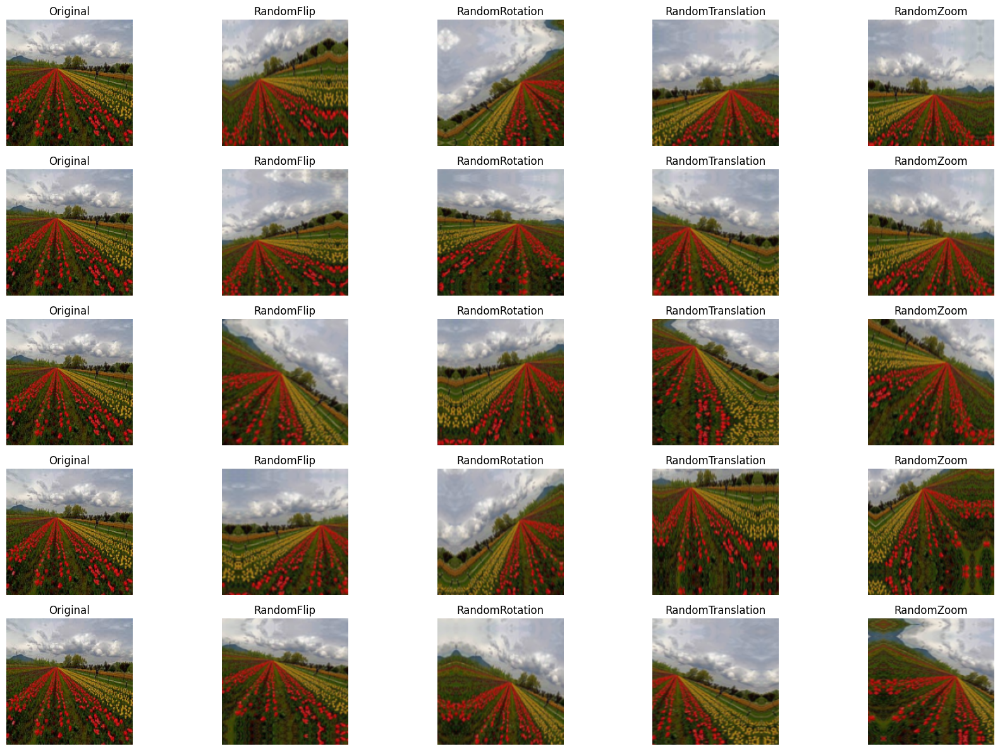

In [11]:
import matplotlib.pyplot as plt

# Function to display images with different augmentations
def display_augmented_images(original_image, augmentation_function, title, ax):
    augmented_image = augmentation_function(original_image)
    ax.imshow(augmented_image.numpy().astype("uint8"))
    ax.set_title(title)
    ax.axis('off')

# Create a sample image for visualization
sample_image, _ = next(iter(train_ds.take(1)))  # Assuming train_ds is your training dataset
original_image = sample_image[0]  # Assuming batch size is 1

# Display images with different augmentations
num_images_to_display = 5  # Number of images to display
fig, axes = plt.subplots(num_images_to_display, len(data_augmentation_layers) + 1, figsize=(18, 12))

for i in range(num_images_to_display):
    # Plot original image
    axes[i, 0].imshow(original_image.numpy().astype("uint8"))
    axes[i, 0].set_title('Original')
    axes[i, 0].axis('off')

    # Apply data augmentation and display augmented images
    for j, augmentation_layer in enumerate(data_augmentation_layers):
        ax = axes[i, j + 1]
        display_augmented_images(original_image, data_augmentation, augmentation_layer.__class__.__name__, ax)

plt.tight_layout()
plt.show()

In [12]:
# Apply `data_augmentation` to the training images.
train_ds = train_ds.map(
    lambda img, label: (data_augmentation(img), label),
    num_parallel_calls=tf_data.AUTOTUNE,
)
# Prefetching samples in GPU memory helps maximize GPU utilization.
train_ds = train_ds.prefetch(tf_data.AUTOTUNE)
val_ds = val_ds.prefetch(tf_data.AUTOTUNE)
test_ds =test_ds.prefetch(tf_data.AUTOTUNE)

FCN Architecture

In [13]:
def make_fcn_model(input_shape, num_classes):
    inputs = Input(shape=input_shape)

    x = Flatten()(inputs)
    x = Dense(256, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)

    x = Dense(128, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)

    outputs = Dense(num_classes, activation='softmax')(x)

    return Model(inputs, outputs)

model = make_fcn_model(input_shape=(180, 180, 3), num_classes=5)
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 180, 180, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 97200)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │      24,883,456 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 5)                   │             645 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,918,533 (95.06 MB)

 Trainable params: 24,917,765 (95.05 MB)

 Non-trainable params: 768 (3.00 KB)

In [14]:
epochs = 30

# Define callbacks
# Define the ModelCheckpoint callback
checkpoint_callback = ModelCheckpoint(
    "fcn.keras",
    monitor='val_loss',  # Monitor validation loss
    save_best_only=True,  # Save only the best model
    mode='min',  # Mode for deciding the best model (minimize validation loss)
    verbose=1
)

# Define the ReduceLROnPlateau callback
reduce_lr_callback = ReduceLROnPlateau(
    monitor='val_loss', 
    factor=0.2, 
    patience=3, 
    min_lr=1e-6
)

# Define the EarlyStopping callback
early_stopping_callback = EarlyStopping(
    monitor='val_loss',
    patience=5,  # Number of epochs with no improvement after which training will be stopped
    restore_best_weights=True
)

# List of callbacks
callbacks = [checkpoint_callback]

# Compile the model
model.compile(
    # Also try adam
    optimizer=tf.keras.optimizers.RMSprop(),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy'],
)

In [15]:
# Train the model
history = model.fit(
    train_ds,
    epochs=epochs,
    callbacks=callbacks,
    validation_data=val_ds
)

Epoch 1/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.3011 - loss: 2.2130
Epoch 1: val_loss improved from inf to 1.99193, saving model to fcn.keras
110/110 ━━━━━━━━━━━━━━━━━━━━ 23s 191ms/step - accuracy: 0.3012 - loss: 2.2119 - val_accuracy: 0.2750 - val_loss: 1.9919
Epoch 2/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.3264 - loss: 1.8166
Epoch 2: val_loss improved from 1.99193 to 1.42598, saving model to fcn.keras
110/110 ━━━━━━━━━━━━━━━━━━━━ 12s 102ms/step - accuracy: 0.3265 - loss: 1.8164 - val_accuracy: 0.4070 - val_loss: 1.4260
Epoch 3/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.3530 - loss: 1.7252
Epoch 3: val_loss did not improve from 1.42598
110/110 ━━━━━━━━━━━━━━━━━━━━ 11s 97ms/step - accuracy: 0.3530 - loss: 1.7248 - val_accuracy: 0.3640 - val_loss: 1.4422
Epoch 4/30
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.3738 - loss: 1.5527
Epoch 4: val_loss improved from 1.42598 to 1.35941, saving model to fcn.keras
110/110 ━━━━━━━━

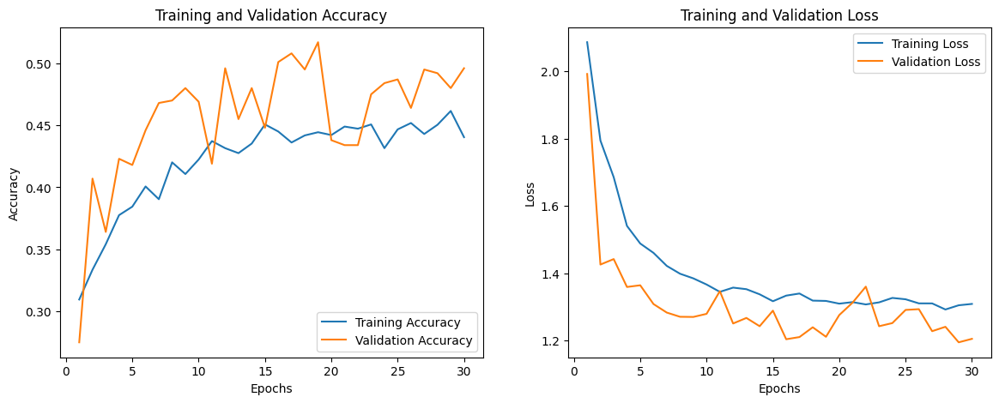

In [16]:
import matplotlib.pyplot as plt

# Get training and validation accuracy
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

# Get training and validation loss
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Create a range of epochs
epochs_range = range(1, epochs + 1)

# Plot training and validation accuracy
plt.figure(figsize=(14, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, train_acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')

# Plot training and validation loss
plt.subplot(1, 2, 2)
plt.plot(epochs_range, train_loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')

plt.show()

In [44]:
import keras

# Load the saved model
model = tf.keras.models.load_model("C:/Users/resha/fcn.keras")

# Evaluate the model on the validation dataset
test_loss, test_accuracy = model.evaluate(test_ds)

print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5453 - loss: 1.1684
Test Loss: 1.178702712059021
Test Accuracy: 0.527999997138977


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


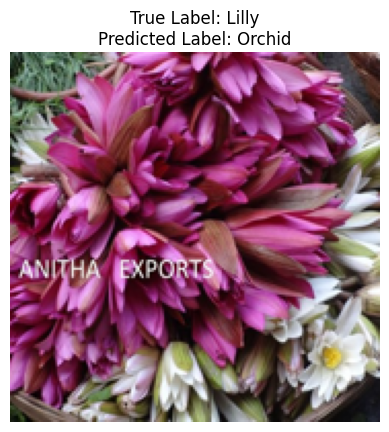

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


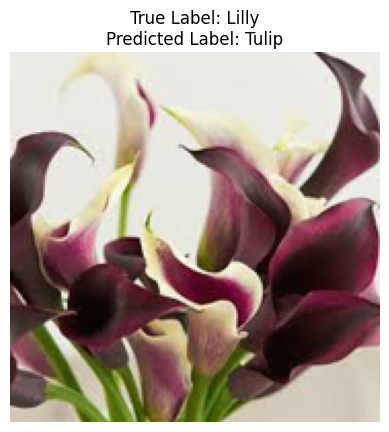

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


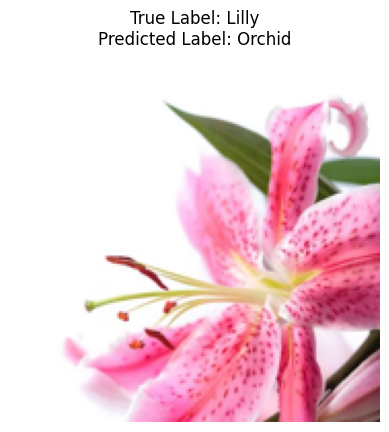

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


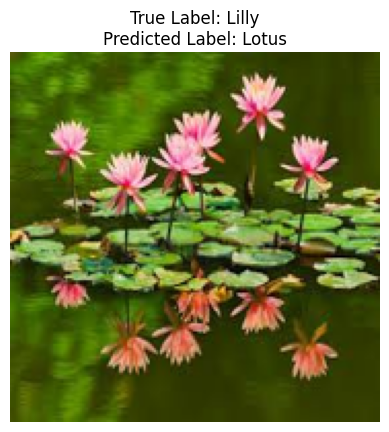

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


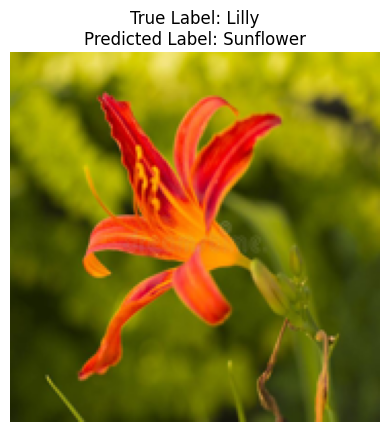

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


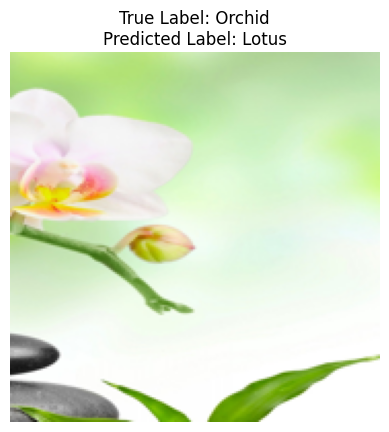

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


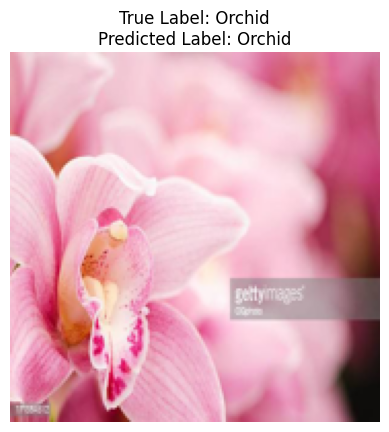

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


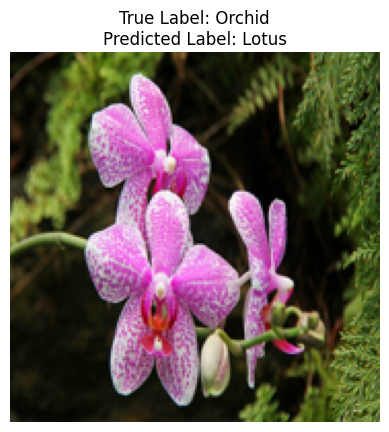

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


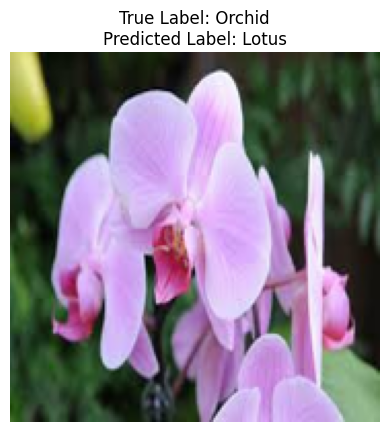

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


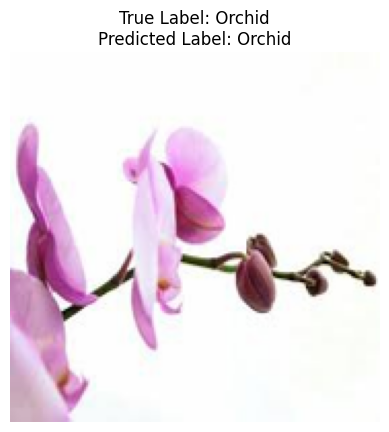

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


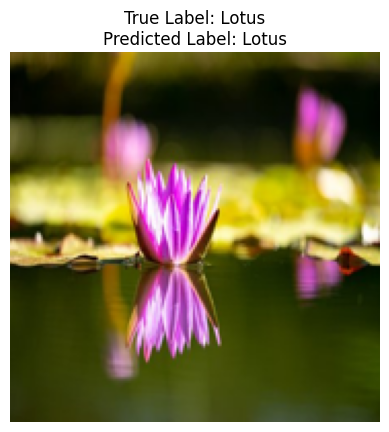

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


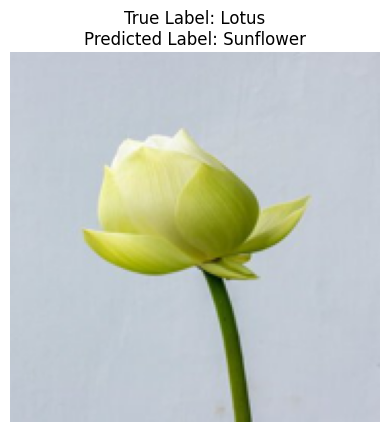

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


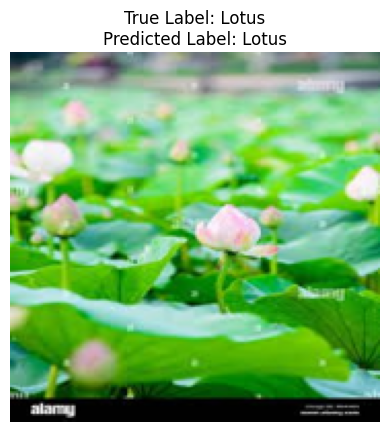

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


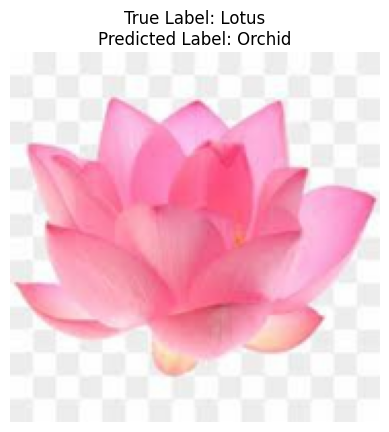

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


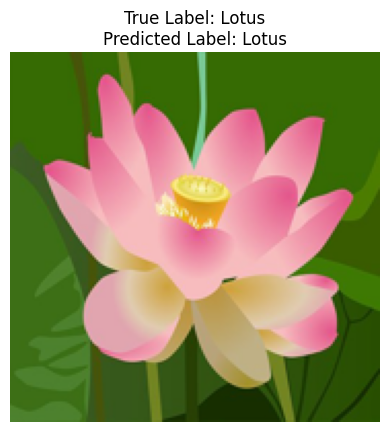

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


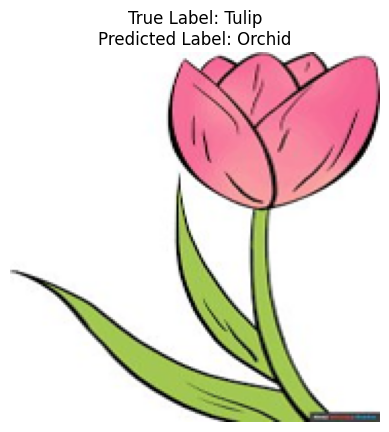

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


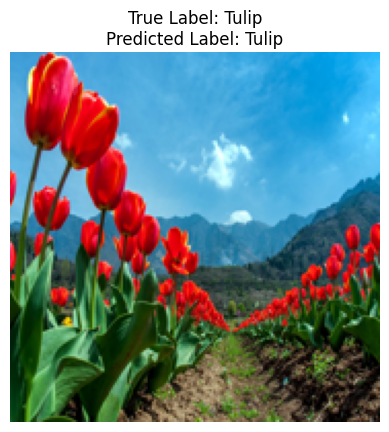

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


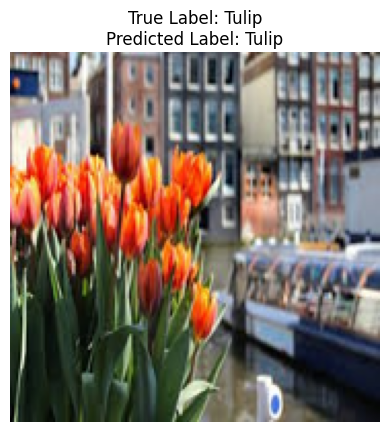

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


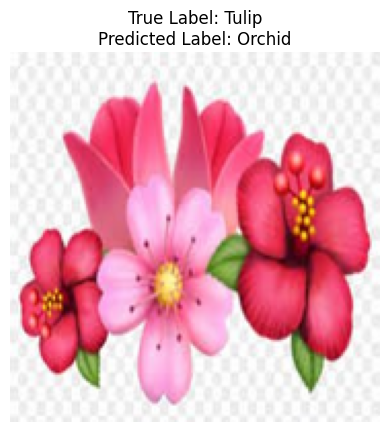

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


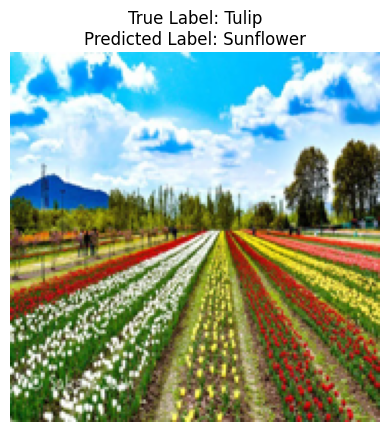

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


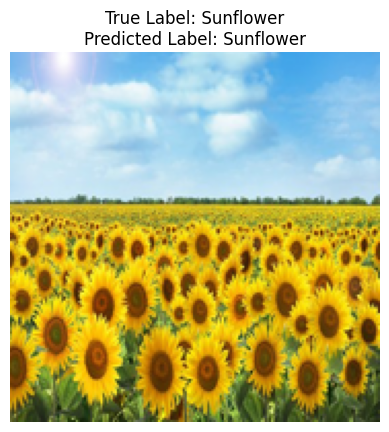

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


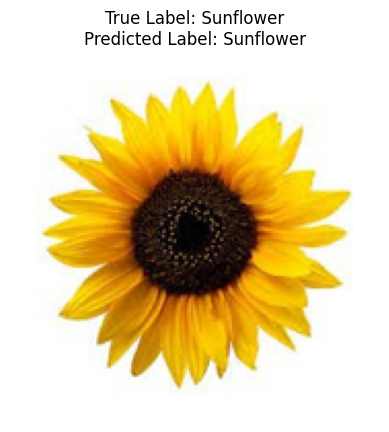

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


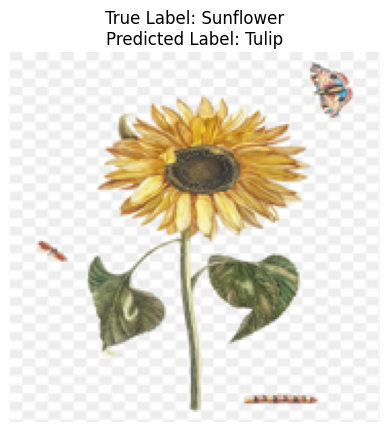

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


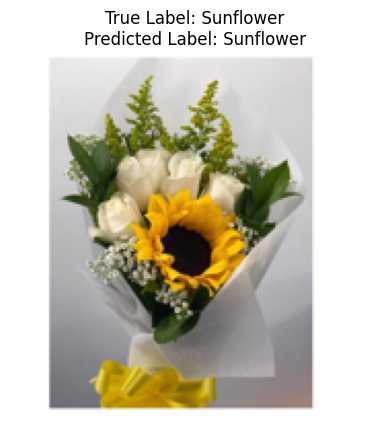

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


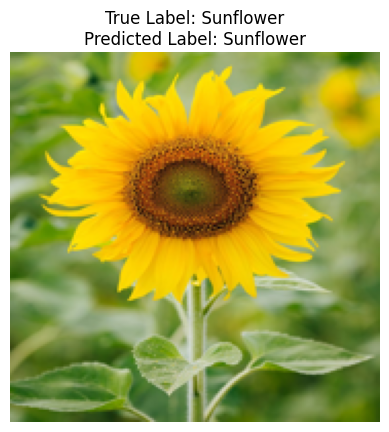

In [45]:
import os
import random
from PIL import Image
import matplotlib.pyplot as plt
class_names_sorted = sorted(class_names)

# Directory containing the test images
test_directory ='C:/Users/resha/Downloads/Working/test'

# Function to perform prediction on a single image without preprocessing
def predict_single_image_without_preprocessing(image_path, model):
    # Load the image and resize it to 180x180
    img = Image.open(image_path)
    img = img.resize((180, 180))
    # Convert the image to a numpy array
    img_array = np.array(img)
    # Expand dimensions to match the input shape expected by the model
    input_img = np.expand_dims(img_array, axis=0)
    # Perform prediction
    prediction = model.predict(input_img)
    # Get the predicted class label
    predicted_class = np.argmax(prediction, axis=1)[0]
    return predicted_class

# Get class names from directories
class_names = sorted(os.listdir(test_directory))

# Randomly select 5 classes
selected_classes = random.sample(class_names, 5)

# Iterate over selected classes
for class_name in selected_classes:
    class_directory = os.path.join(test_directory, class_name)
    # Get image files from class directory
    image_files = os.listdir(class_directory)
    # Randomly select 5 images
    selected_images = random.sample(image_files, 5)
    # Iterate over selected images
    for image_file in selected_images:
        image_path = os.path.join(class_directory, image_file)
        # Get the true label
        true_label = class_name
        # Perform prediction
        predicted_class = predict_single_image_without_preprocessing(image_path, model)
        # Get the predicted class name
        predicted_class_name = class_names_sorted[predicted_class]
        
        # Load, resize, and display the original image
        img = Image.open(image_path)
        img = img.resize((180, 180))
        plt.imshow(img)
        plt.title(f"True Label: {true_label}\nPredicted Label: {predicted_class_name}")
        plt.axis('off')
        plt.show()


CNN

In [18]:
def make_cnn_model(input_shape, num_classes):
    inputs = Input(shape=input_shape)
    x = Conv2D(32, (3, 3), activation='relu')(inputs)
    x = MaxPooling2D((2, 2))(x)
    x = BatchNormalization()(x)
    x = Dropout(0.4)(x)

    x = Conv2D(64, (3, 3), activation='relu')(x)
    x = MaxPooling2D((2, 2))(x)
    x = BatchNormalization()(x)
    x = Dropout(0.4)(x)

    x = Conv2D(128, (3, 3), activation='relu')(x)
    x = MaxPooling2D((2, 2))(x)
    x = BatchNormalization()(x)
    x = Dropout(0.4)(x)

    x = Conv2D(128, (3, 3), activation='relu')(x)
    x = MaxPooling2D((2, 2))(x)
    x = BatchNormalization()(x)
    x = Dropout(0.4)(x)
    
    x = Conv2D(128, (3, 3), activation='relu')(x)
    x = MaxPooling2D((2, 2))(x)
    x = BatchNormalization()(x)
    x = Dropout(0.4)(x)


    x = Flatten()(x)
    x = Dense(32, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.4)(x)

    outputs = Dense(num_classes, activation='softmax')(x)

    return Model(inputs, outputs)

model = make_cnn_model(input_shape=(180, 180, 3), num_classes=5)
model.summary()


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 180, 180, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 178, 178, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 89, 89, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 89, 89, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 89, 89, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 87, 87, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 43, 43, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 43, 43, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 43, 43, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 41, 41, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 20, 20, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 20, 20, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 20, 20, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 18, 18, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 9, 9, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 9, 9, 128)           │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 9, 9, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 7, 7, 128)           │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 3, 3, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 427,525 (1.63 MB)

 Trainable params: 426,501 (1.63 MB)

 Non-trainable params: 1,024 (4.00 KB)

CNN

In [19]:
epochs = 70

# Define callbacks
# Define the ModelCheckpoint callback
checkpoint_callback = ModelCheckpoint(
    "best_model.keras",
    monitor='val_loss',  # Monitor validation loss
    save_best_only=True,  # Save only the best model
    mode='min',  # Mode for deciding the best model (minimize validation loss)
    verbose=1
)

# Define the ReduceLROnPlateau callback
reduce_lr_callback = ReduceLROnPlateau(
    monitor='val_loss', 
    factor=0.2, 
    patience=3, 
    min_lr=1e-6
)

# Define the EarlyStopping callback
early_stopping_callback = EarlyStopping(
    monitor='val_loss',
    patience=5,  # Number of epochs with no improvement after which training will be stopped
    restore_best_weights=True
)

# List of callbacks
callbacks = [checkpoint_callback]

# Compile the model
model.compile(
    optimizer=tf.keras.optimizers.RMSprop(),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy'],
)

In [20]:
# Train the model
history = model.fit(
    train_ds,
    epochs=epochs,
    callbacks=callbacks,
    validation_data=val_ds
)

Epoch 1/70
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step - accuracy: 0.3331 - loss: 1.9026
Epoch 1: val_loss improved from inf to 3.91896, saving model to best_model.keras
110/110 ━━━━━━━━━━━━━━━━━━━━ 37s 314ms/step - accuracy: 0.3334 - loss: 1.9008 - val_accuracy: 0.2940 - val_loss: 3.9190
Epoch 2/70
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step - accuracy: 0.4091 - loss: 1.4669
Epoch 2: val_loss improved from 3.91896 to 1.61096, saving model to best_model.keras
110/110 ━━━━━━━━━━━━━━━━━━━━ 36s 321ms/step - accuracy: 0.4093 - loss: 1.4662 - val_accuracy: 0.4850 - val_loss: 1.6110
Epoch 3/70
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 302ms/step - accuracy: 0.4814 - loss: 1.3100
Epoch 3: val_loss improved from 1.61096 to 1.15425, saving model to best_model.keras
110/110 ━━━━━━━━━━━━━━━━━━━━ 36s 322ms/step - accuracy: 0.4815 - loss: 1.3098 - val_accuracy: 0.5320 - val_loss: 1.1542
Epoch 4/70
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step - accuracy: 0.4979 - loss: 1.2222
Epoch 4: val_loss improved from 1.154

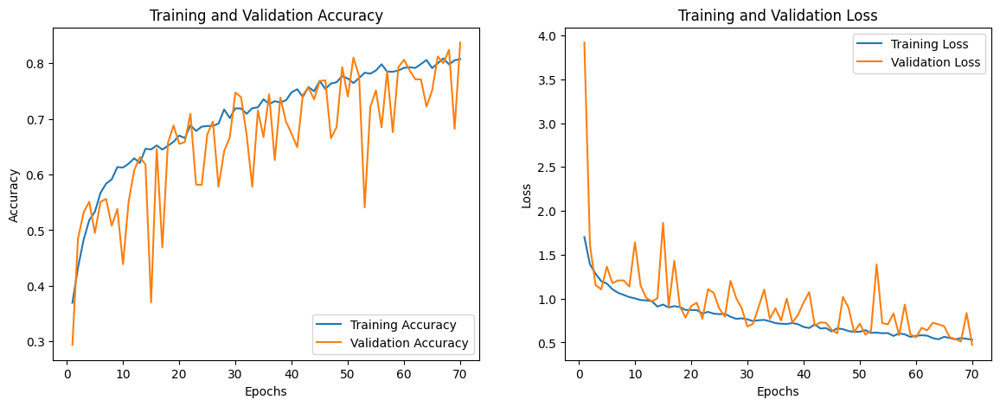

In [21]:
import matplotlib.pyplot as plt

# Get training and validation accuracy
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

# Get training and validation loss
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Create a range of epochs
epochs_range = range(1, epochs + 1)

# Plot training and validation accuracy
plt.figure(figsize=(14, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, train_acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')

# Plot training and validation loss
plt.subplot(1, 2, 2)
plt.plot(epochs_range, train_loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')

plt.show()

In [22]:
import keras

# Load the saved model
model = tf.keras.models.load_model("C:/Users/resha/best_model.keras")

# Evaluate the model on the validation dataset
test_loss, test_accuracy = model.evaluate(test_ds)

print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")

16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - accuracy: 0.8110 - loss: 0.5036
Test Loss: 0.4910842478275299
Test Accuracy: 0.8199999928474426


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step


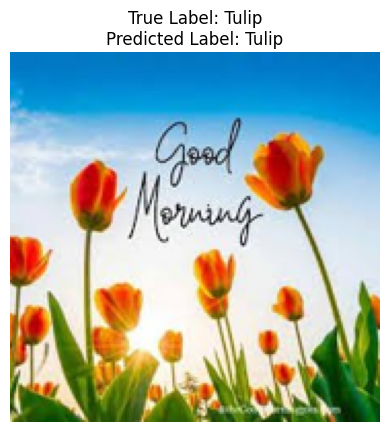

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


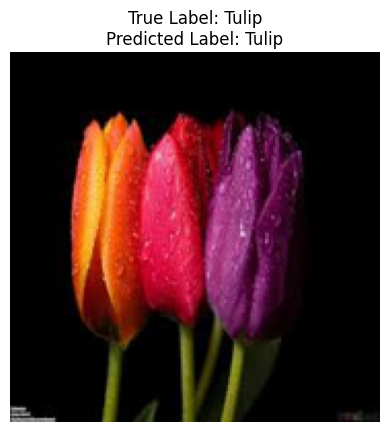

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


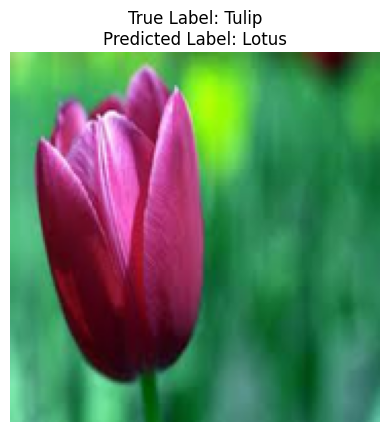

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


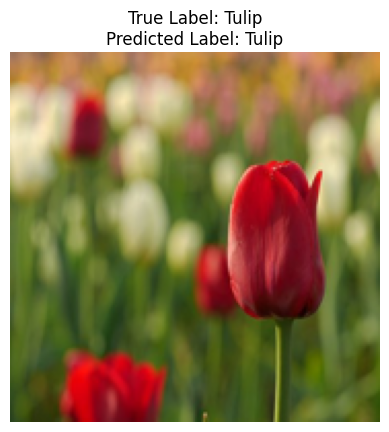

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


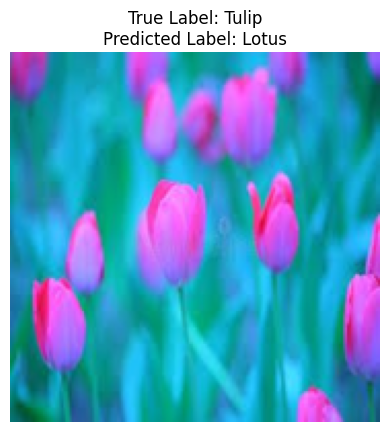

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


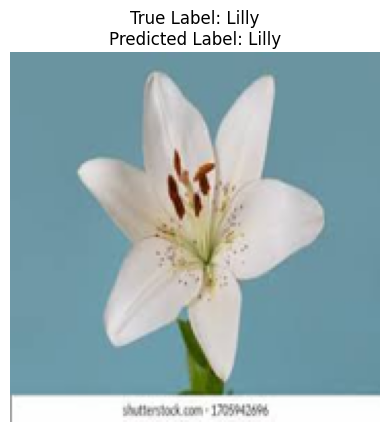

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


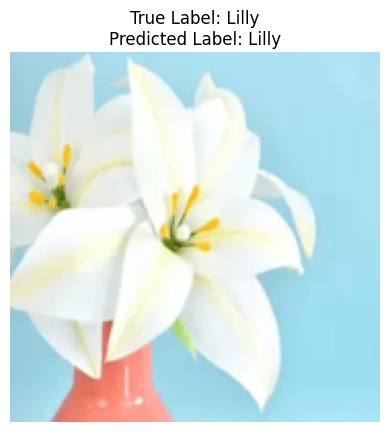

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


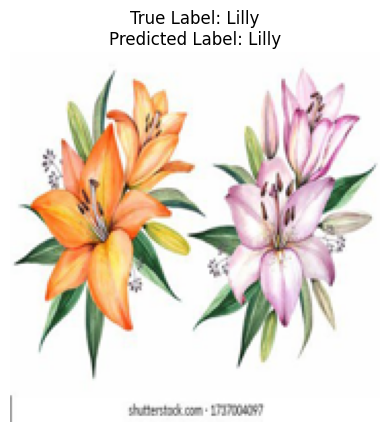

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


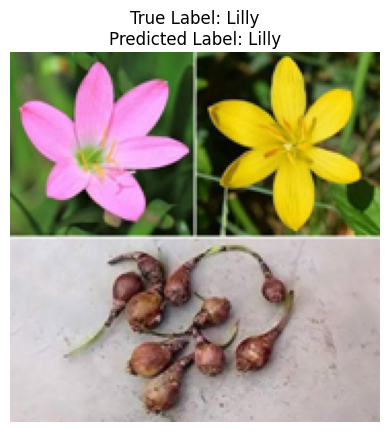

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


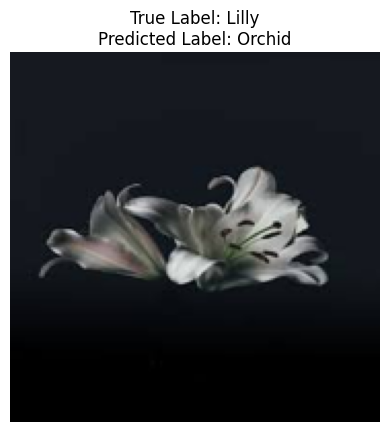

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


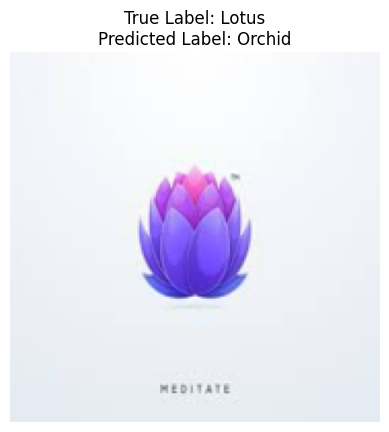

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


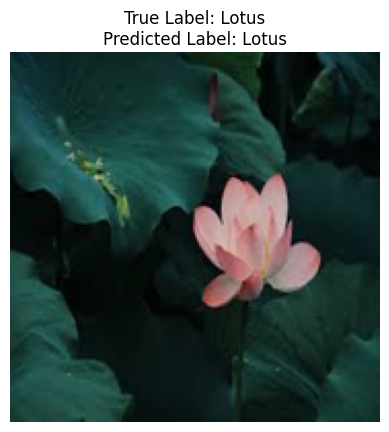

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


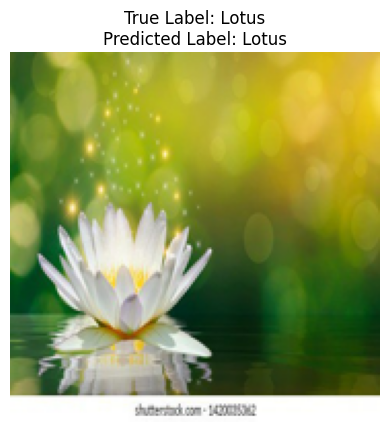

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


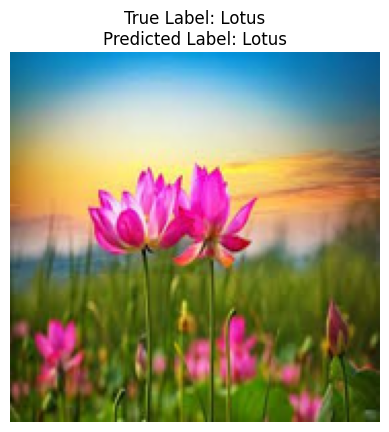

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


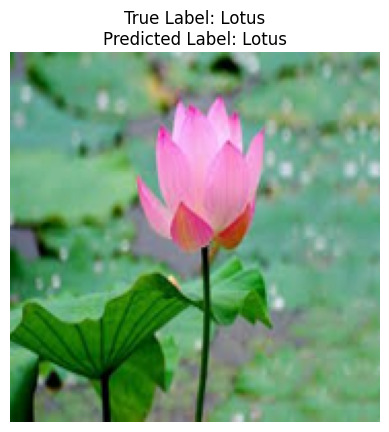

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


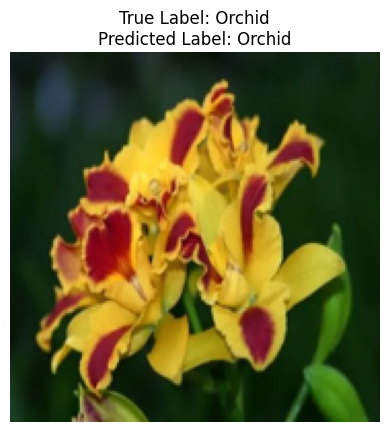

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


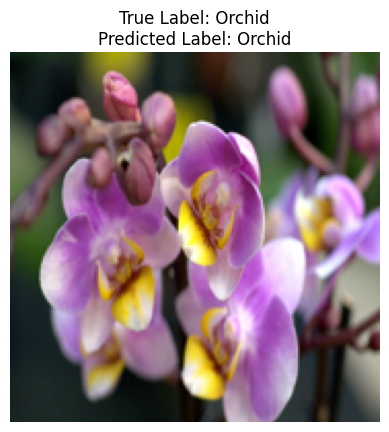

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


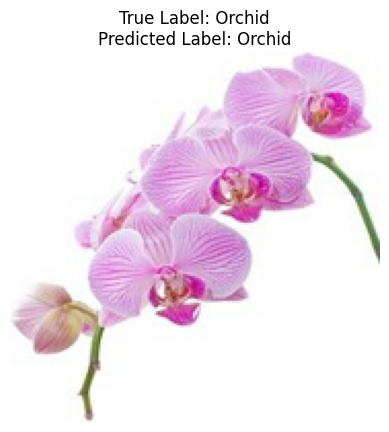

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


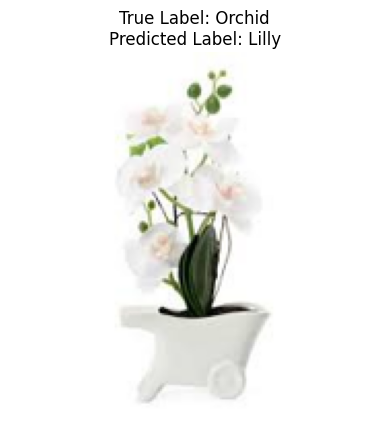

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


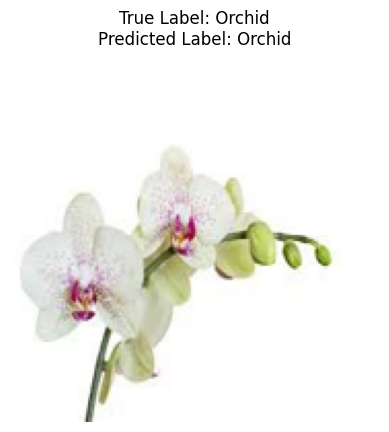

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


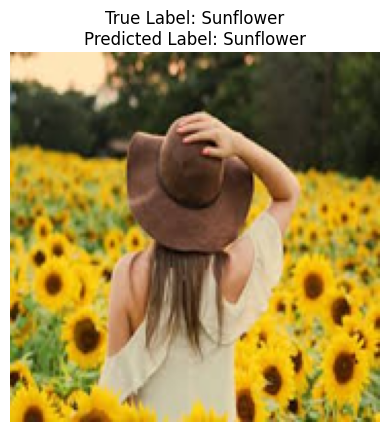

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


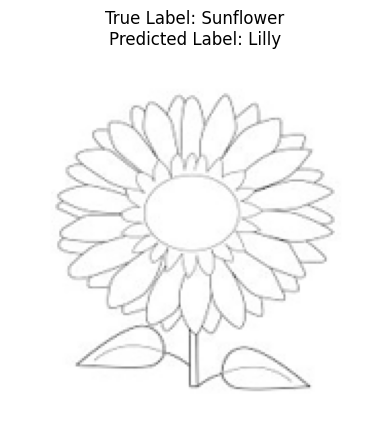

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


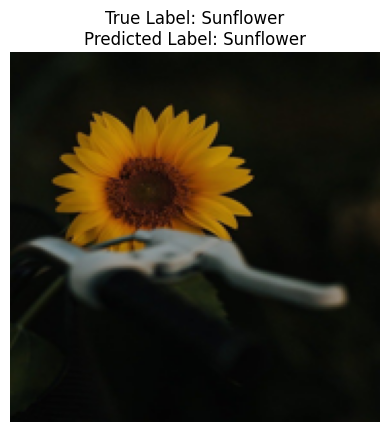

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


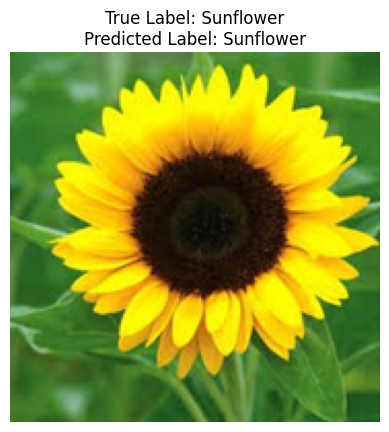

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


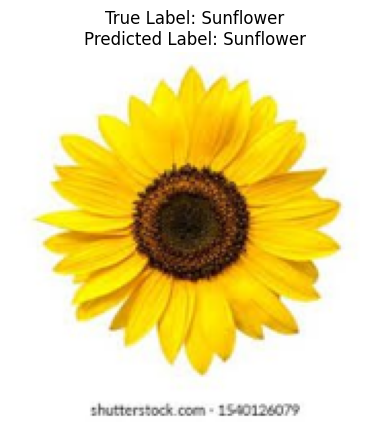

In [23]:
import os
import random
from PIL import Image
import matplotlib.pyplot as plt
class_names_sorted = sorted(class_names)

# Directory containing the test images
test_directory = "C:/Users/resha/Downloads/Working/test"

# Function to perform prediction on a single image without preprocessing
def predict_single_image_without_preprocessing(image_path, model):
    # Load the image and resize it to 180x180
    img = Image.open(image_path)
    img = img.resize((180, 180))
    # Convert the image to a numpy array
    img_array = np.array(img)
    # Expand dimensions to match the input shape expected by the model
    input_img = np.expand_dims(img_array, axis=0)
    # Perform prediction
    prediction = model.predict(input_img)
    # Get the predicted class label
    predicted_class = np.argmax(prediction, axis=1)[0]
    return predicted_class

# Get class names from directories
class_names = sorted(os.listdir(test_directory))

# Randomly select 5 classes
selected_classes = random.sample(class_names, 5)

# Iterate over selected classes
for class_name in selected_classes:
    class_directory = os.path.join(test_directory, class_name)
    # Get image files from class directory
    image_files = os.listdir(class_directory)
    # Randomly select 5 images
    selected_images = random.sample(image_files, 5)
    # Iterate over selected images
    for image_file in selected_images:
        image_path = os.path.join(class_directory, image_file)
        # Get the true label
        true_label = class_name
        # Perform prediction
        predicted_class = predict_single_image_without_preprocessing(image_path, model)
        # Get the predicted class name
        predicted_class_name = class_names_sorted[predicted_class]
        
        # Load, resize, and display the original image
        img = Image.open(image_path)
        img = img.resize((180, 180))
        plt.imshow(img)
        plt.title(f"True Label: {true_label}\nPredicted Label: {predicted_class_name}")
        plt.axis('off')
        plt.show()


In [24]:
# Print the class labels and their indices
for i, class_name in enumerate(class_names):
    print(f"Class: {class_name}, Index: {i}")


Class: Lilly, Index: 0
Class: Lotus, Index: 1
Class: Orchid, Index: 2
Class: Sunflower, Index: 3
Class: Tulip, Index: 4


Transfer Learning

In [25]:
preprocess_input = tf.keras.applications.resnet_v2.preprocess_input

In [26]:
IMG_SHAPE = image_size + (3,)

In [27]:
base_model = tf.keras.applications.ResNet152V2(input_shape=IMG_SHAPE,
                                               include_top=False,
                                               weights='imagenet'
                                               )

234545216/234545216 ━━━━━━━━━━━━━━━━━━━━ 157s 1us/step


In [28]:
image_batch, label_batch = next(iter(train_ds))
feature_batch = base_model(image_batch)
print(feature_batch.shape)

(32, 6, 6, 2048)


In [29]:
#Freeze the convolutional base
base_model.trainable = False

In [30]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 2048)


In [31]:
prediction_layer = tf.keras.layers.Dense(75, activation = 'softmax')
prediction_batch = prediction_layer(feature_batch_average)
print(prediction_batch.shape)

(32, 75)


In [32]:

inputs = tf.keras.Input(shape=(180, 180, 3))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training=False)
x = global_average_layer(x)
x = tf.keras.layers.Dense(2048, activation='relu')(x)
x = tf.keras.layers.Dropout(0.5)(x)
outputs = prediction_layer(x)
model = tf.keras.Model(inputs, outputs)

In [33]:
checkpoint_callback = ModelCheckpoint(
    "transfer_model.keras",
    monitor='val_loss',  # Monitor validation loss
    save_best_only=True,  # Save only the best model
    mode='min',  # Mode for deciding the best model (minimize validation loss)
    verbose=1
)

# Define the ReduceLROnPlateau callback
reduce_lr_callback = ReduceLROnPlateau(
    monitor='val_loss', 
    factor=0.2, 
    patience=3, 
    min_lr=1e-6
)

# Define the EarlyStopping callback
early_stopping_callback = EarlyStopping(
    monitor='val_loss',
    patience=5,  # Number of epochs with no improvement after which training will be stopped
    restore_best_weights=True
)

# List of callbacks
callbacks = [checkpoint_callback]

# Compile the model

base_learning_rate = 0.0001
model.compile(optimizer=keras.optimizers.RMSprop(learning_rate=base_learning_rate),
              loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [34]:
print(model.summary())

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)           │ (None, 180, 180, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_flip (RandomFlip)             │ (None, 180, 180, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_rotation (RandomRotation)     │ (None, 180, 180, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_translation                   │ (None, 180, 180, 3)         │               0 │
│ (RandomTranslation)                  │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ random_zoom (RandomZoom)             │ (None, 180, 180, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ true_divide (TrueDivide)             │ (None, 180, 180, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ subtract (Subtract)                  │ (None, 180, 180, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ resnet152v2 (Functional)             │ (None, 6, 6, 2048)          │      58,331,648 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 2048)                │       4,196,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_8 (Dropout)                  │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 75)                  │         153,675 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 62,681,675 (239.11 MB)

 Trainable params: 4,350,027 (16.59 MB)

 Non-trainable params: 58,331,648 (222.52 MB)

None


In [35]:
#train the model
initial_epochs = 20
loss0, accuracy0 = model.evaluate(val_ds)

32/32 ━━━━━━━━━━━━━━━━━━━━ 44s 1s/step - accuracy: 0.0000e+00 - loss: 5.3165


In [36]:
#train the model
history = model.fit(train_ds,
                    epochs=initial_epochs,
                    callbacks=callbacks,
                    validation_data=val_ds)

Epoch 1/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.4274 - loss: 1.7927
Epoch 1: val_loss improved from inf to 0.70875, saving model to transfer_model.keras
110/110 ━━━━━━━━━━━━━━━━━━━━ 209s 2s/step - accuracy: 0.4284 - loss: 1.7882 - val_accuracy: 0.7530 - val_loss: 0.7088
Epoch 2/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6694 - loss: 0.9033
Epoch 2: val_loss improved from 0.70875 to 0.61542, saving model to transfer_model.keras
110/110 ━━━━━━━━━━━━━━━━━━━━ 195s 2s/step - accuracy: 0.6696 - loss: 0.9028 - val_accuracy: 0.7920 - val_loss: 0.6154
Epoch 3/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.7165 - loss: 0.8013
Epoch 3: val_loss improved from 0.61542 to 0.54364, saving model to transfer_model.keras
110/110 ━━━━━━━━━━━━━━━━━━━━ 192s 2s/step - accuracy: 0.7166 - loss: 0.8010 - val_accuracy: 0.8090 - val_loss: 0.5436
Epoch 4/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.7155 - loss: 0.7858
Epoch 4: val_loss did not improve from 0.54

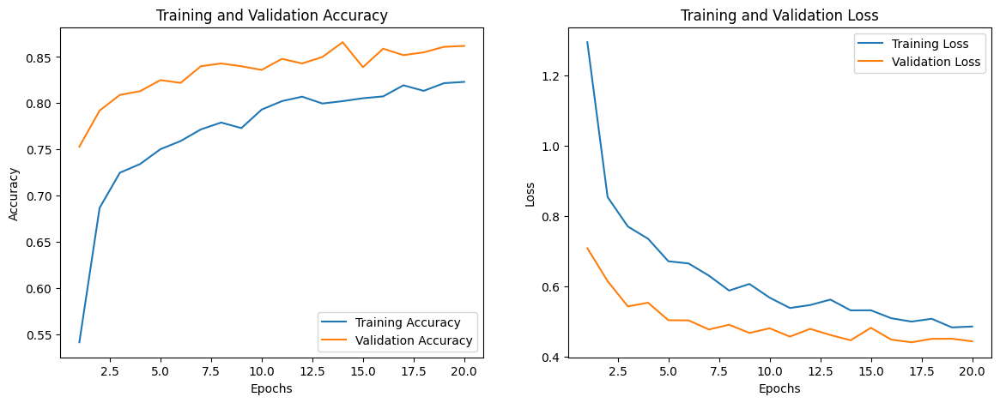

In [37]:
import matplotlib.pyplot as plt

# Get training and validation accuracy
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

# Get training and validation loss
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Create a range of epochs
epochs_range = range(1, initial_epochs + 1)

# Plot training and validation accuracy
plt.figure(figsize=(14, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, train_acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')

# Plot training and validation loss
plt.subplot(1, 2, 2)
plt.plot(epochs_range, train_loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')

plt.show()

In [38]:
import keras

# Load the saved model
model = keras.models.load_model("C:/Users/resha/transfer_model.keras")

# Evaluate the model on the validation _set
test_loss, test_accuracy = model.evaluate(test_ds)

print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")

16/16 ━━━━━━━━━━━━━━━━━━━━ 24s 1s/step - accuracy: 0.8973 - loss: 0.3939
Test Loss: 0.4494093656539917
Test Accuracy: 0.871999979019165


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


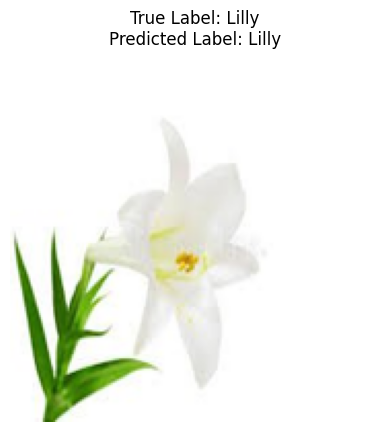

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


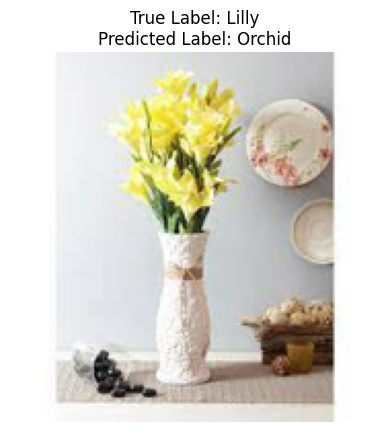

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


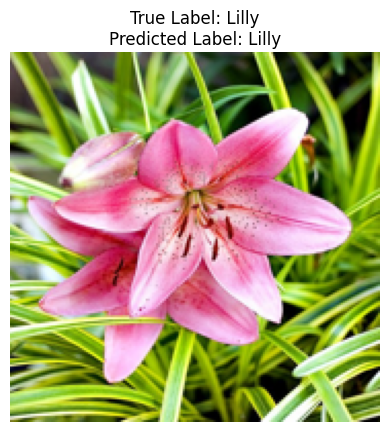

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step


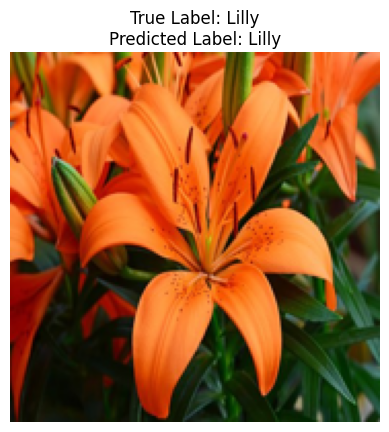

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


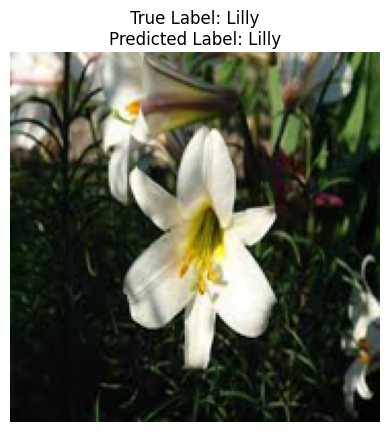

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


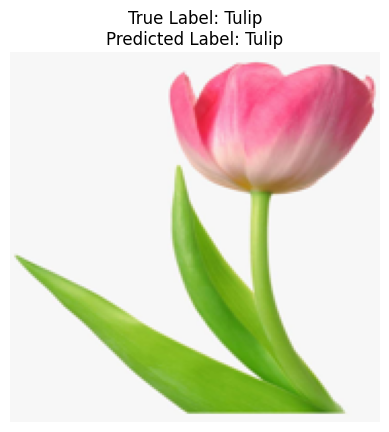

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


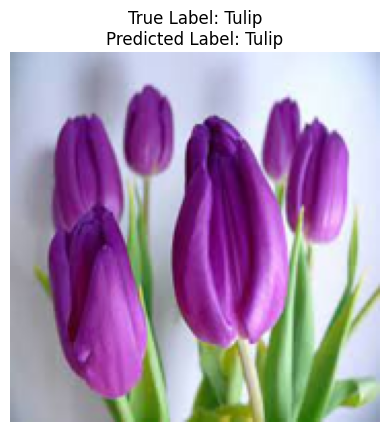

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


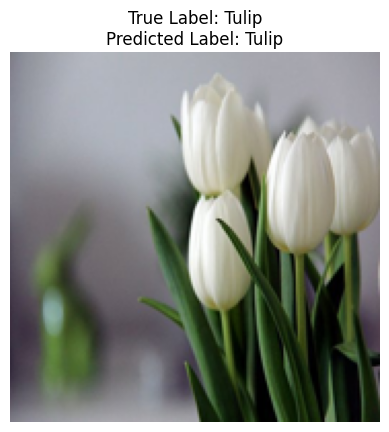

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


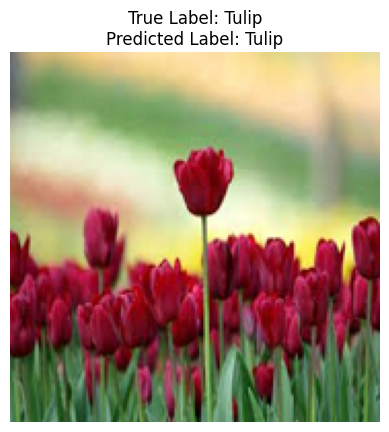

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


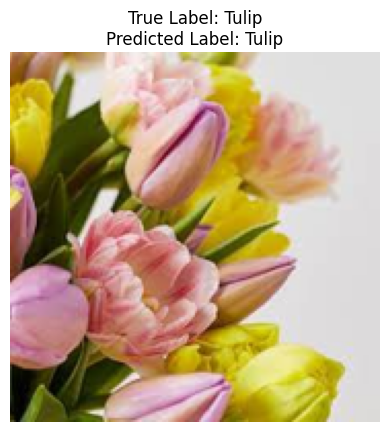

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


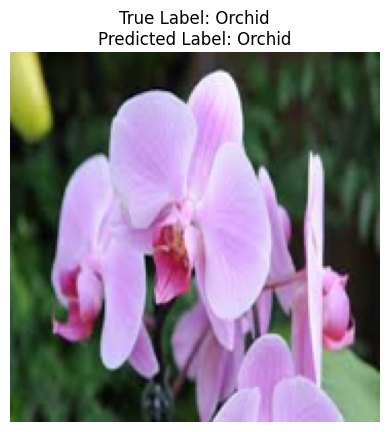

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step


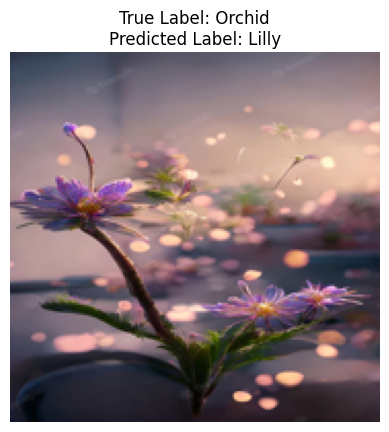

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


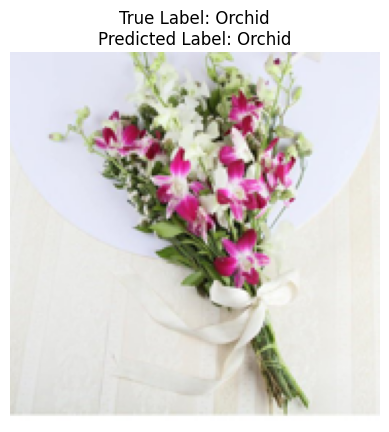

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


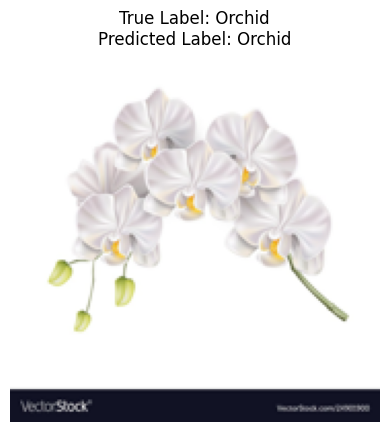

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


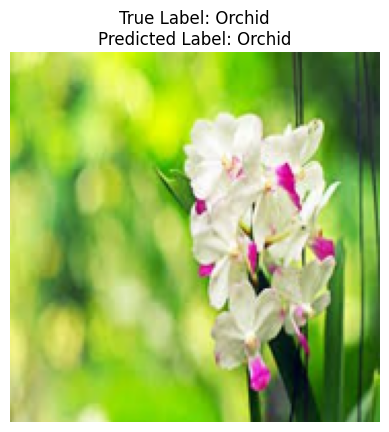

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


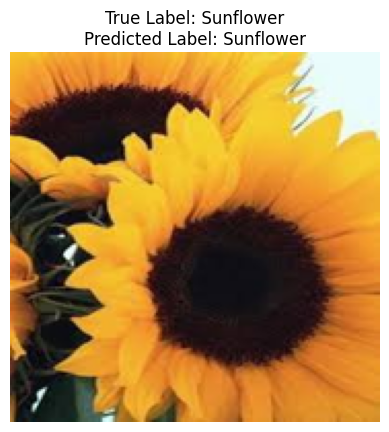

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


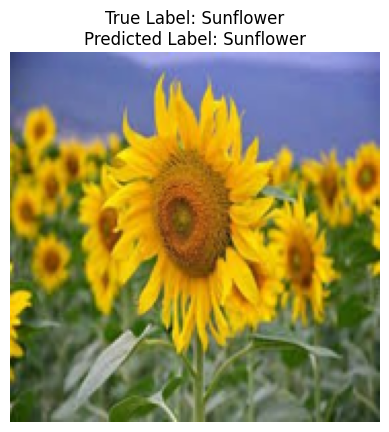

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


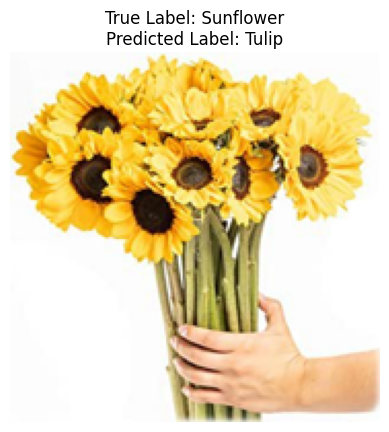

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


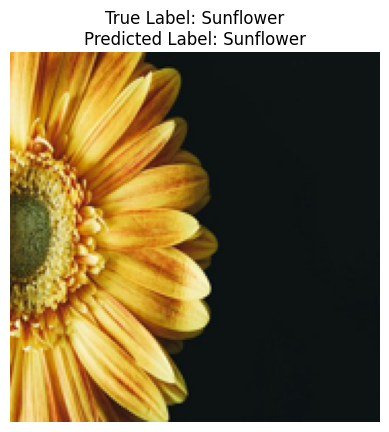

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


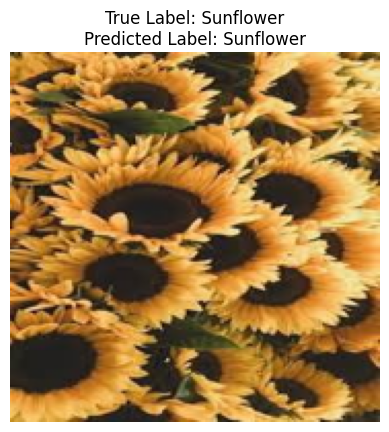

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


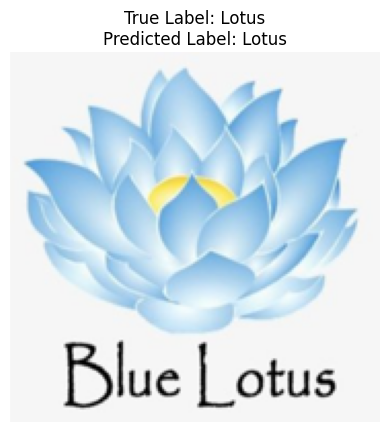

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


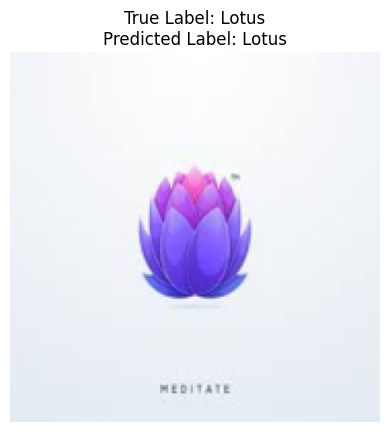

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step


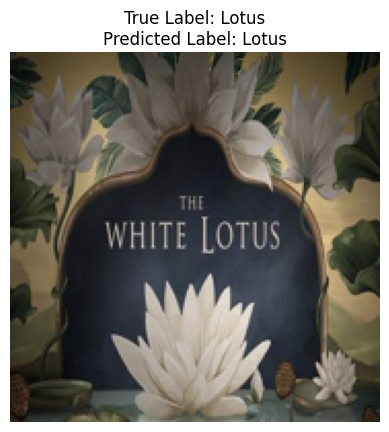

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


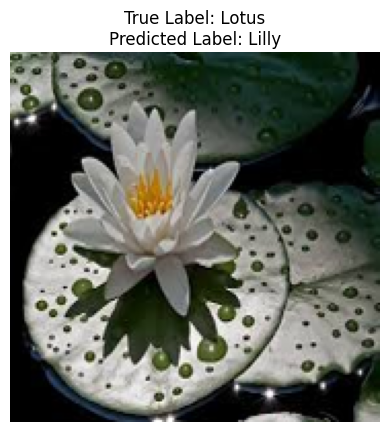

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step


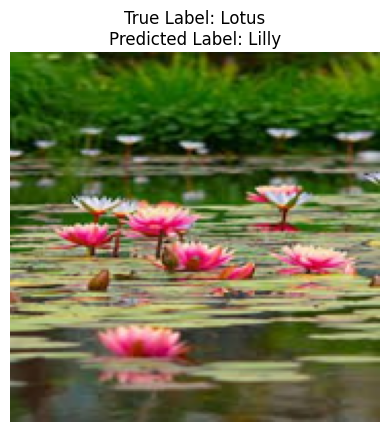

In [42]:
import os
import random
from PIL import Image
import matplotlib.pyplot as plt
class_names_sorted = sorted(class_names)

# Directory containing the test images
test_directory ='C:/Users/resha/Downloads/Working/test'

# Function to perform prediction on a single image without preprocessing
def predict_single_image_without_preprocessing(image_path, model):
    # Load the image and resize it to 180x180
    img = Image.open(image_path)
    img = img.resize((180, 180))
    # Convert the image to a numpy array
    img_array = np.array(img)
    # Expand dimensions to match the input shape expected by the model
    input_img = np.expand_dims(img_array, axis=0)
    # Perform prediction
    prediction = model.predict(input_img)
    # Get the predicted class label
    predicted_class = np.argmax(prediction, axis=1)[0]
    return predicted_class

# Get class names from directories
class_names = sorted(os.listdir(test_directory))

# Randomly select 5 classes
selected_classes = random.sample(class_names, 5)

# Iterate over selected classes
for class_name in selected_classes:
    class_directory = os.path.join(test_directory, class_name)
    # Get image files from class directory
    image_files = os.listdir(class_directory)
    # Randomly select 5 images
    selected_images = random.sample(image_files, 5)
    # Iterate over selected images
    for image_file in selected_images:
        image_path = os.path.join(class_directory, image_file)
        # Get the true label
        true_label = class_name
        # Perform prediction
        predicted_class = predict_single_image_without_preprocessing(image_path, model)
        # Get the predicted class name
        predicted_class_name = class_names_sorted[predicted_class]
        
        # Load, resize, and display the original image
        img = Image.open(image_path)
        img = img.resize((180, 180))
        plt.imshow(img)
        plt.title(f"True Label: {true_label}\nPredicted Label: {predicted_class_name}")
        plt.axis('off')
        plt.show()
